In this file you can evaluate how the model behaves on a desired queries. Simply change paths to the model and csv file with embeddings

In [2]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Layer
from tensorflow.keras.models import Model
import cv2
from PIL import Image as PILImage
import glob
import os
from annoy import AnnoyIndex
import matplotlib.pyplot as plt

import csv
import pandas as pd


2025-01-29 16:04:01.363417: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-01-29 16:04:01.384317: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-01-29 16:04:01.390016: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-01-29 16:04:01.407763: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2025-01-29 16:04:02.245841: W tensorflow/compiler/tf2

In [3]:
IMAGE_SIZE = (256, 256)

In [4]:
def imshow(a, size=1.0):
    # Clip and convert the image to uint8
    a = a.clip(0, 255).astype("uint8")
    
    # Resize the image if a size factor is provided
    if size != 1.0:
        new_dim = (int(a.shape[1] * size), int(a.shape[0] * size))
        a = cv2.resize(a, new_dim, interpolation=cv2.INTER_AREA)
    
    # Display the image
    display(PILImage.fromarray(a))

In [5]:
#Change to different read_image depending on the model
def read_image(file_path):
    """Read and preprocess the image."""
    img = cv2.imread(file_path)
    img = cv2.resize(img, IMAGE_SIZE)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    return img

In [6]:
data_folder = os.path.abspath(os.path.join(os.getcwd(), "..", "Data_Final/*"))
image_files = glob.glob(os.path.join(data_folder, "*.jpg"), recursive=True)

In [7]:
csv_files = ["classification_model_embeddings.csv",
             "classification_model_embeddings_retrained.csv",
             "ResNet50.csv",
             "ResNet50_retrained.csv",
             "contrastive_triplets.csv",
             "contrastive_more_triplets.csv"]

models  = ["classification_model",
             "classification_model_retrained",
             "ResNet50",
             "ResNet50_retrained",
             "contrastive_triplets",
             "contrastive_more_triplets"]

In [8]:
from sklearn.metrics.pairwise import cosine_similarity

def get_most_similar_images(query_image_path, embedding_model, embeddings_df, k=5):
    query_image = read_image(query_image_path)
    query_image = np.expand_dims(query_image, axis=0)
    
    query_embedding = embedding_model.predict(query_image).flatten()
    
    embeddings = embeddings_df.drop(columns=['filename']).values
    filenames = embeddings_df['filename'].values
    
    similarities = cosine_similarity([query_embedding], embeddings)
    
    top_k_indices = similarities[0].argsort()[-k:][::-1]
    
    most_similar_filenames = filenames[top_k_indices]
    
    return most_similar_filenames, similarities[0][top_k_indices]

In [9]:
class L2Normalization(Layer):
    def call(self, inputs):
        return tf.math.l2_normalize(inputs, axis=1)

/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/001.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/003.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/005.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/009.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/013.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/016.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/017.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/018.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/023.jpg
1/1 ━

/tmp/ipykernel_272282/3357604765.py:31: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 4, figsize=(15, 5))


/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/images.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/panda.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/pexels-anca-silvia-orosz-3360787-5030891-scaled.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/racoon.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/random.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/random_2.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
/mnt/c/Studia/5th_term/Computer_Vision/SearchEngine-CV/Queries_Final/random_5.jpg
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


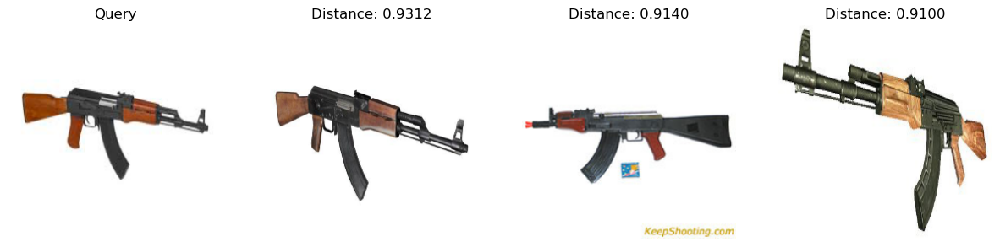

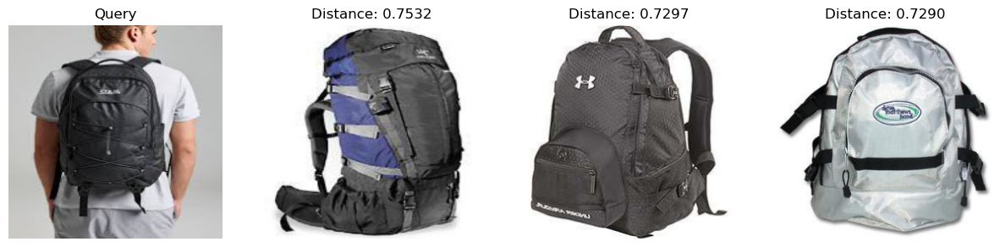

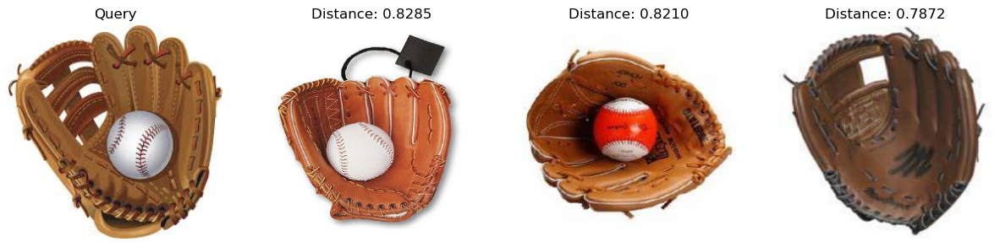

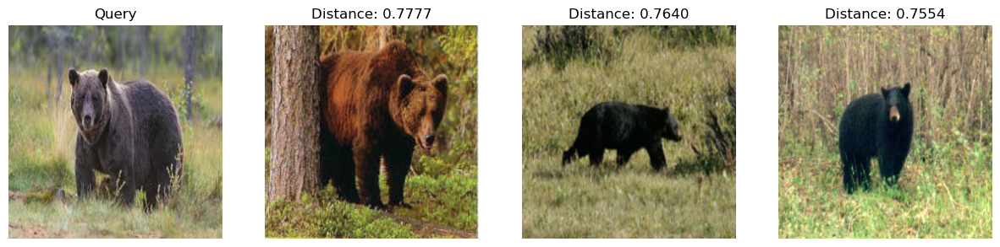

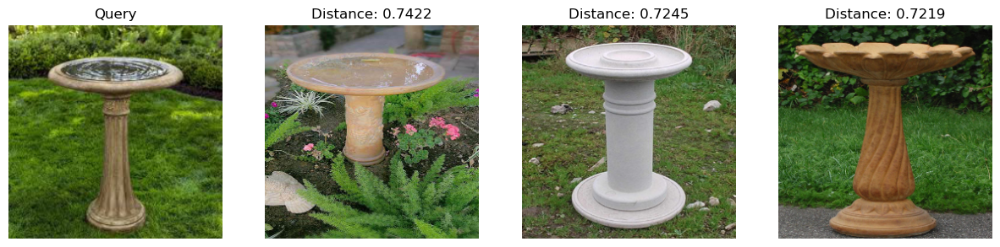

...

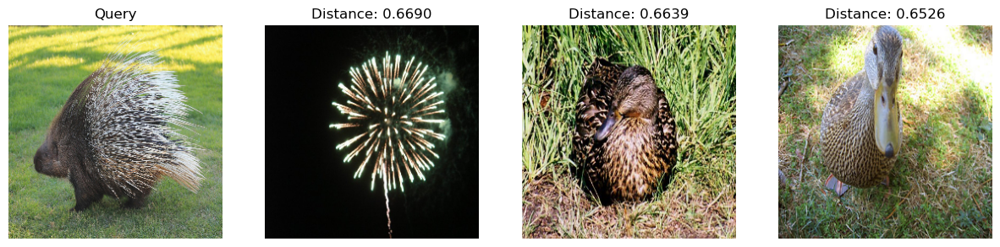

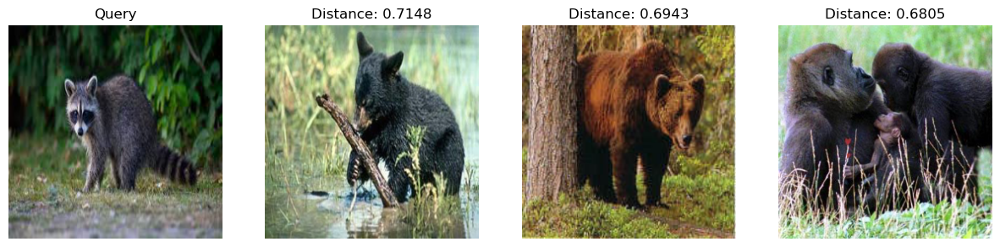

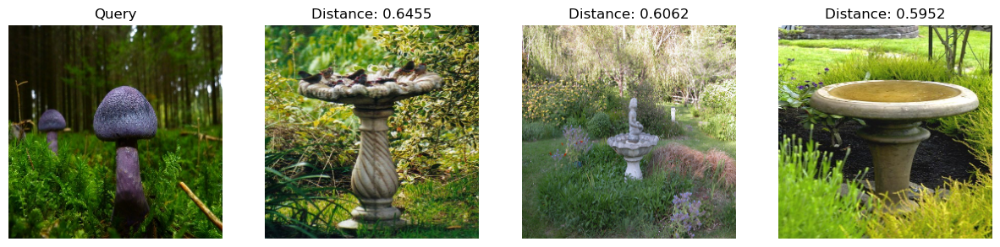

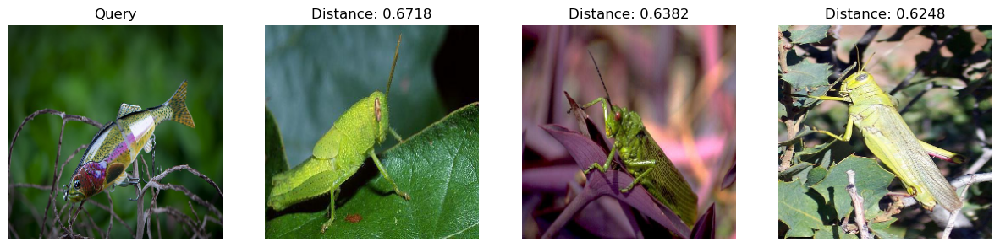

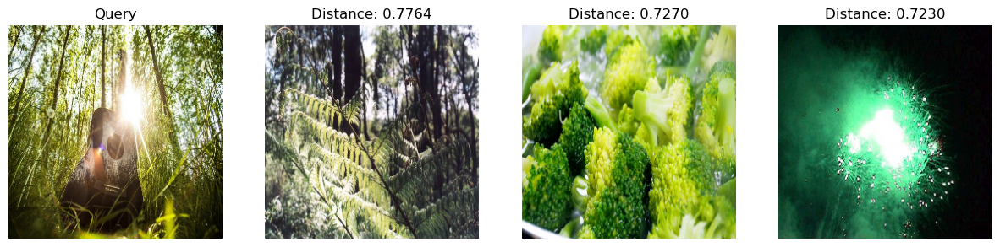

In [16]:
import matplotlib.pyplot as plt

i=0


model_path = "App/src/Models/"+models[i]+".keras"
csv_file = "App/src/CSVs/"+csv_files[i]

model_path = "ResNet50.keras"
csv_file = "ResNet50_pure_new.csv"


embedding_model = load_model(model_path,
                   custom_objects={"L2Normalization": L2Normalization})
embeddings_df = pd.read_csv(csv_file)

query_folder = os.path.abspath(os.path.join(os.getcwd(), "..", "Queries_Final/*"))
query_files = glob.glob(query_folder)

for query in query_files:
    print(query)
    query_img = read_image(query)
    
    matches, dists = get_most_similar_images(query, embedding_model, embeddings_df, k=3)
  
    match_1 = read_image(data_folder[:-1]+matches[0])
    match_2 = read_image(data_folder[:-1]+matches[1])
    match_3 = read_image(data_folder[:-1]+matches[2])
    
    
    fig, axes = plt.subplots(1, 4, figsize=(15, 5))
    
    axes[0].imshow(query_img)
    axes[0].set_title("Query")
    axes[0].axis("off")
    
    axes[1].imshow(match_1)
    axes[1].set_title(f"Distance: {dists[0]:.4f}")
    axes[1].axis("off")
    
    axes[2].imshow(match_2)
    axes[2].set_title(f"Distance: {dists[1]:.4f}")
    axes[2].axis("off")
    
    axes[3].imshow(match_3)
    axes[3].set_title(f"Distance: {dists[2]:.4f}")
    axes[3].axis("off")